# Longitudinal trend plots with session summaries

This notebook replaces the dense session-by-session violins with cleaner longitudinal line plots showing session means, uncertainty bands, and optional subject-level trajectories.


In [1]:

import os
import sys
import pathlib
from collections import defaultdict

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.formula.api as smf
from statsmodels.stats.multitest import multipletests

project_root = pathlib.Path.cwd().parent
sys.path.append(str(project_root))

DATA_ROOT = '../../../Data/'
METRICS_PATH = "../../../Results/Tessnim/all_subjects_yeo7_metrics.csv"

FIGURES_DIR = "../../../Results/Tessnim/figures/"
os.makedirs(FIGURES_DIR, exist_ok=True)

YEO_NAMES = [
    'Visual',
    'Somatomotor',
    'Dorsal Attention',
    'Ventral Attention',
    'Limbic',
    'Frontoparietal',
    'Default',
]

NETWORK_COLORS = [
    '#4C78A8',
    '#F58518',
    '#54A24B',
    '#E45756',
    '#72B7B2',
    '#B279A2',
    '#FF9DA6',
]

In [2]:
df_export = pd.read_csv(METRICS_PATH)

net_agg = (
    df_export.groupby(['subject', 'session', 'run', 'condition', 'network'], as_index=False)
    .agg({
        'segregation': 'mean',
        'integration': 'mean',
    })
)

df_r200 = net_agg.rename(columns={'segregation': 'segregation'}).copy()
df_r200['session_num'] = df_r200['session'].str.extract(r'V(\d+)', expand=False).astype(int)
df_r200['subject'] = df_r200['subject'].astype('category')

df_r200.head()


,subject,session,run,condition,network,segregation,integration,session_num
0,003GNV,V01,Run1,Feedback,1,0.689422,0.472992,1
1,003GNV,V01,Run1,Feedback,2,0.648899,0.548251,1
2,003GNV,V01,Run1,Feedback,3,0.667988,0.495816,1
3,003GNV,V01,Run1,Feedback,4,0.616424,0.528531,1
4,003GNV,V01,Run1,Feedback,5,0.533973,0.502783,1


In [3]:
def build_alldata_from_df(df):
    alldata = {}
    grouped = df.groupby(['subject', 'session', 'run'])

    for (sid, sessid, runkey), g in grouped:
        subj = alldata.setdefault(sid, {'sessions': {}})
        sessruns = subj['sessions'].setdefault(sessid, {})

        row = {
            'condition': g['condition'].iloc[0],
            'segregation': np.full(7, np.nan),
            'integration': np.full(7, np.nan),
        }

        for _, r in g.iterrows():
            idx = int(r['network']) - 1
            row['segregation'][idx] = r['segregation']
            row['integration'][idx] = r['integration']

        sessruns[runkey] = row

    return alldata


def collect_rows(alldata, condition_filter=None):
    subject_rows = {}
    for sid, subj in alldata.items():
        rows = []
        for sessid, sessruns in subj['sessions'].items():
            for runkey in sorted(sessruns.keys(), key=lambda x: int(str(x).replace('Run', '')) if str(x).startswith('Run') and str(x).replace('Run', '').isdigit() else str(x)):
                rd = sessruns[runkey]
                if condition_filter is not None and rd['condition'] != condition_filter:
                    continue
                rows.append({
                    'subject': sid,
                    'session': sessid,
                    'run': runkey,
                    'condition': rd['condition'],
                    'segregation': rd['segregation'],
                    'integration': rd['integration'],
                })
        subject_rows[sid] = rows
    return subject_rows


alldata = build_alldata_from_df(df_r200)


C:\Users\tesni\AppData\Local\Temp\ipykernel_14084\2712573559.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = df.groupby(['subject', 'session', 'run'])


In [4]:
def fit_lmm_per_network(df, metric, condition_filter=None, correction='fdr_bh'):
    work = df.copy()
    if condition_filter is not None:
        work = work[work['condition'] == condition_filter].copy()

    results = []
    for net in sorted(work['network'].unique()):
        df_net = work[work['network'] == net].copy()
        model = smf.mixedlm(f'{metric} ~ session_num', df_net, groups=df_net['subject'])
        res = model.fit(method='lbfgs', disp=False)
        results.append({
            'network': int(net),
            'n_obs': int(df_net.shape[0]),
            'beta_session': float(res.params['session_num']),
            'se_session': float(res.bse['session_num']),
            'z_session': float(res.tvalues['session_num']),
            'p_session': float(res.pvalues['session_num']),
        })

    out = pd.DataFrame(results).sort_values('network').reset_index(drop=True)
    reject, p_corr, _, _ = multipletests(out['p_session'].values, method=correction)
    out['p_corr'] = p_corr
    out['sig_corr'] = reject
    return out


def stars_from_p(p):
    if p < 0.001:
        return '***'
    if p < 0.01:
        return '**'
    if p < 0.05:
        return '*'
    return 'ns'


seg_stats = fit_lmm_per_network(df_r200, metric='segregation')
int_stats = fit_lmm_per_network(df_r200, metric='integration')

seg_stats


c:\Users\tesni\miniconda3\envs\ada\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)
c:\Users\tesni\miniconda3\envs\ada\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:1634: UserWarning: Random effects covariance is singular
  warnings.warn(msg)
c:\Users\tesni\miniconda3\envs\ada\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2054: UserWarning: The random effects covariance matrix is singular.
  warnings.warn(_warn_cov_sing)
c:\Users\tesni\miniconda3\envs\ada\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)
c:\Users\tesni\miniconda3\envs\ada\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2245: UserWarning: The random effects covariance matrix is singular.
  warnings.warn(_w

,network,n_obs,beta_session,se_session,z_session,p_session,p_corr,sig_corr
0,1,1886,-0.001960,0.000336,-5.828804,5.582594e-09,9.769540e-09,True
1,2,1886,-0.001802,0.000455,-3.960462,7.480481e-05,8.727228e-05,True
2,3,1886,-0.003073,0.000360,-8.539369,1.349570e-17,9.446987e-17,True
3,4,1886,-0.003114,0.000394,-7.907559,2.624850e-15,9.186974e-15,True
4,5,1886,0.000112,0.000414,0.271123,7.862961e-01,7.862961e-01,False
5,6,1886,-0.002861,0.000370,-7.726115,1.108788e-14,2.587173e-14,True
6,7,1886,-0.001964,0.000367,-5.356143,8.501700e-08,1.190238e-07,True


In [5]:
def draw_violin_axes(ax, x_labels, data_matrix, title, ylabel, color, hline_zero=False):
    positions = np.arange(len(x_labels))
    datasets = [data_matrix[j, ~np.isnan(data_matrix[j])] for j in range(len(x_labels))]

    valid_pos = [i for i, d in enumerate(datasets) if len(d) >= 2]
    valid_data = [d for d in datasets if len(d) >= 2]

    if valid_data:
        vp = ax.violinplot(
            valid_data,
            positions=valid_pos,
            widths=0.8,
            showmeans=False,
            showmedians=False,
            showextrema=False,
        )
        for body in vp['bodies']:
            body.set_facecolor(color)
            body.set_edgecolor('black')
            body.set_linewidth(0.5)
            body.set_alpha(0.8)

        for pos, d in zip(valid_pos, valid_data):
            med = np.median(d)
            ax.plot([pos - 0.2, pos + 0.2], [med, med], color='black', lw=1.4)

    single_pos = [i for i, d in enumerate(datasets) if len(d) == 1]
    single_vals = [d[0] for d in datasets if len(d) == 1]
    if single_pos:
        ax.scatter(single_pos, single_vals, color='black', s=12, zorder=3)

    if hline_zero:
        ax.axhline(0, color='gray', linestyle='--', linewidth=0.8)

    ax.set_title(title, fontsize=12, fontweight='bold')
    ax.set_ylabel(ylabel, fontsize=10)
    ax.set_xticks(positions)
    ax.set_xticklabels(x_labels, rotation=45, ha='right', fontsize=8)
    ax.tick_params(axis='y', labelsize=9)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)


def make_centered_7_axes(figsize=(20, 8), dpi=300):
    fig = plt.figure(figsize=figsize, dpi=dpi)
    gs = fig.add_gridspec(2, 12, wspace=0.5, hspace=0.45)
    axes = [
        fig.add_subplot(gs[0, 0:3]),
        fig.add_subplot(gs[0, 3:6]),
        fig.add_subplot(gs[0, 6:9]),
        fig.add_subplot(gs[0, 9:12]),
        fig.add_subplot(gs[1, 1:4]),
        fig.add_subplot(gs[1, 4:7]),
        fig.add_subplot(gs[1, 7:10]),
    ]
    return fig, axes


In [6]:
def plot_violin_per_network_sessions_with_stats(
    all_data,
    yeo_names,
    df_long,
    stats_df,
    metric='segregation',
    condition_filter=None,
    figsize=(20, 8),
    dpi=300,
    save_path=None,
):
    metric_labels = {
        'segregation': 'Segregation',
        'integration': 'Integration',
        'normalized_segregation': 'Norm. Segregation',
    }

    subject_rows = collect_rows(all_data, condition_filter)
    cond_str = f' [{condition_filter}]' if condition_filter else ''

    all_sessions = sorted({r['session'] for rows in subject_rows.values() for r in rows}, key=lambda s: int(str(s).replace('V', '')))
    sess_to_idx = {s: i for i, s in enumerate(all_sessions)}

    n_sessions = len(all_sessions)
    n_subjects = len(subject_rows)
    n_nets = len(yeo_names)

    cubes = {m: np.full((n_sessions, n_subjects, n_nets), np.nan) for m in metric_labels}

    for s_idx, (_, rows) in enumerate(subject_rows.items()):
        sess_groups = defaultdict(list)
        for r in rows:
            sess_groups[r['session']].append(r)

        for sess, sess_rows in sess_groups.items():
            si = sess_to_idx[sess]
            cubes['segregation'][si, s_idx, :] = np.nanmean(np.vstack([r['segregation'] for r in sess_rows]), axis=0)
            cubes['integration'][si, s_idx, :] = np.nanmean(np.vstack([r['integration'] for r in sess_rows]), axis=0)

    fig, axes_list = make_centered_7_axes(figsize=figsize, dpi=dpi)
    fig.suptitle(f"{metric_labels[metric]} - per network, session averages{cond_str}", fontsize=14, fontweight='bold', y=0.98)

    work_df = df_long.copy()
    if condition_filter is not None:
        work_df = work_df[work_df['condition'] == condition_filter].copy()

        



    for net_i in range(n_nets):
        ax = axes_list[net_i]
        data_matrix = cubes[metric][:, :, net_i]

        draw_violin_axes(
            ax=ax,
            x_labels=all_sessions,
            data_matrix=data_matrix,
            title=yeo_names[net_i],
            ylabel=metric_labels[metric],
            color=NETWORK_COLORS[net_i],
            hline_zero=(metric == 'normalized_segregation'),
        )

        net_id = net_i + 1
        net_df = work_df[work_df['network'] == net_id].copy()

        if not net_df.empty:
            session_means = net_df.groupby('session_num', as_index=False)[metric].mean().sort_values('session_num')
            ols_fit = smf.ols(f'{metric} ~ session_num', data=net_df).fit()
            x = session_means['session_num'].values
            y_pred = ols_fit.predict(pd.DataFrame({'session_num': x}))
            ax.plot(np.arange(len(x)), y_pred, color='black', linestyle='--', linewidth=1.2)

        stat_row = stats_df.loc[stats_df['network'] == net_id]
        if not stat_row.empty:
            beta = float(stat_row['beta_session'].iloc[0])
            p_raw = float(stat_row['p_session'].iloc[0])
            p_corr = float(stat_row['p_corr'].iloc[0])
            stars = stars_from_p(p_corr)
            txt = f"β={beta:.3f}\nFDR p={p_corr:.1e} ({stars})"
            ax.text(
                0.98, 0.96, txt,
                transform=ax.transAxes,
                ha='right', va='top',
                fontsize=8,
                bbox=dict(boxstyle='round,pad=0.25', fc='white', ec='none', alpha=0.8),
            )

    if save_path is not None:
        fig.savefig(save_path, dpi=dpi, bbox_inches='tight')

    plt.show()
    return fig


In [7]:
seg_stats


,network,n_obs,beta_session,se_session,z_session,p_session,p_corr,sig_corr
0,1,1886,-0.001960,0.000336,-5.828804,5.582594e-09,9.769540e-09,True
1,2,1886,-0.001802,0.000455,-3.960462,7.480481e-05,8.727228e-05,True
2,3,1886,-0.003073,0.000360,-8.539369,1.349570e-17,9.446987e-17,True
3,4,1886,-0.003114,0.000394,-7.907559,2.624850e-15,9.186974e-15,True
4,5,1886,0.000112,0.000414,0.271123,7.862961e-01,7.862961e-01,False
5,6,1886,-0.002861,0.000370,-7.726115,1.108788e-14,2.587173e-14,True
6,7,1886,-0.001964,0.000367,-5.356143,8.501700e-08,1.190238e-07,True


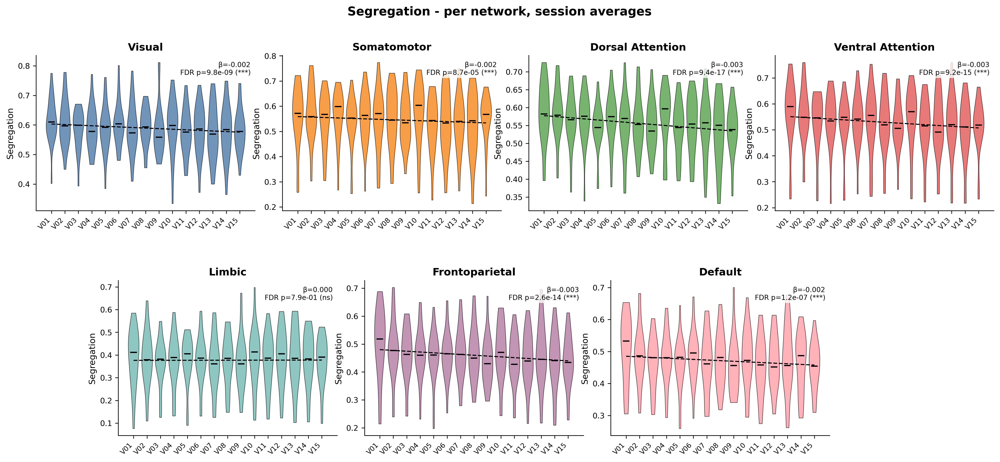

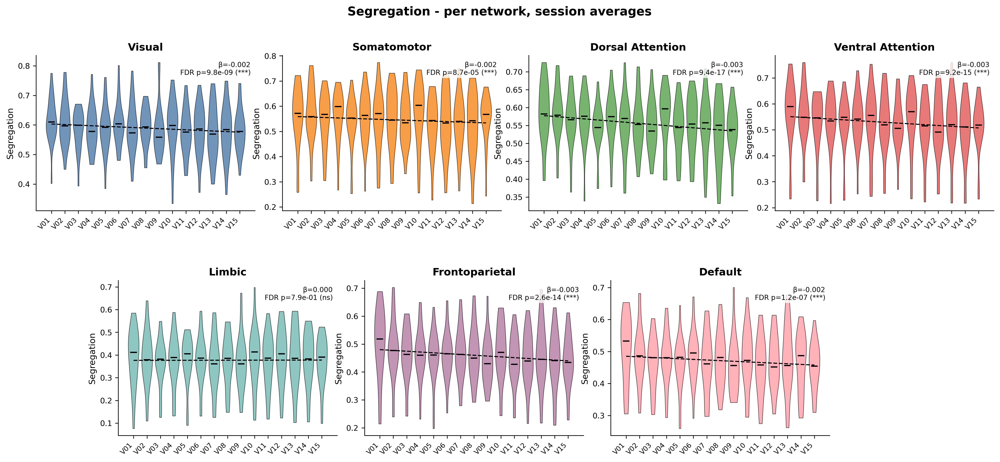

In [8]:
plot_violin_per_network_sessions_with_stats(
    all_data=alldata,
    yeo_names=YEO_NAMES,
    df_long=df_r200,
    stats_df=seg_stats,
    metric='segregation',
    save_path=os.path.join(FIGURES_DIR, 'segregation_violin_sessions_stats.png'),
)

In [9]:
int_stats


,network,n_obs,beta_session,se_session,z_session,p_session,p_corr,sig_corr
0,1,1886,-0.002205,0.000409,-5.393331,6.916355e-08,8.069080e-08,True
1,2,1886,-0.003142,0.000442,-7.101946,1.230126e-12,1.722177e-12,True
2,3,1886,-0.003142,0.000424,-7.402325,1.338201e-13,2.341852e-13,True
3,4,1886,-0.003513,0.000428,-8.208701,2.235944e-16,7.825805e-16,True
4,5,1886,-0.002015,0.000403,-4.999967,5.734016e-07,5.734016e-07,True
5,6,1886,-0.003492,0.000413,-8.449962,2.913971e-17,2.039780e-16,True
6,7,1886,-0.003408,0.000438,-7.775948,7.488470e-15,1.747310e-14,True


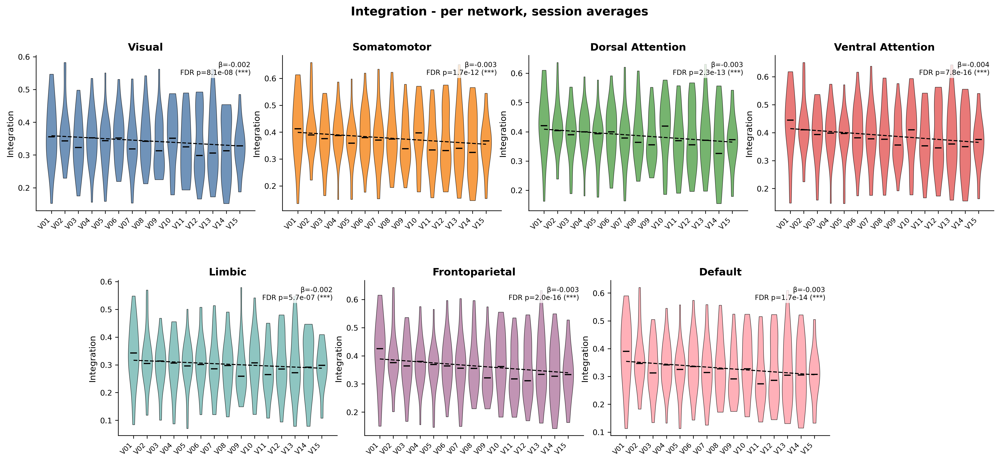

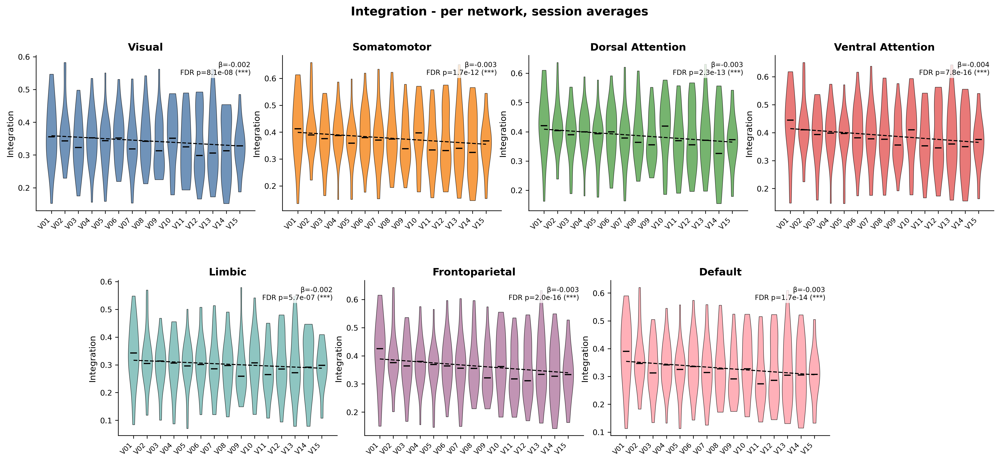

In [10]:
plot_violin_per_network_sessions_with_stats(
    all_data=alldata,
    yeo_names=YEO_NAMES,
    df_long=df_r200,
    stats_df=int_stats,
    metric='integration',
    save_path=os.path.join(FIGURES_DIR, 'integration_violin_sessions_stats.png'),
)

## Notes

- The dashed black line is a simple OLS trend drawn on top of the violin plot for readability.
- The annotation box shows the **linear mixed model** slope per session and the **FDR-corrected p-value** across the 7 networks.
- You can also pass `condition_filter='Feedback'` to reproduce condition-specific panels.


## Cleaner longitudinal figure

This version emphasizes session-wise means and uncertainty, with optional faint subject trajectories in the background. It is intended as a clearer main-result figure than the original violin grid.


In [11]:
def session_summary(df, metric, condition_filter=None):
    work = df.copy()
    if condition_filter is not None:
        work = work[work['condition'] == condition_filter].copy()

    summary = (
        work.groupby(['network', 'session_num', 'session'], as_index=False)
            .agg(
                mean_value=(metric, 'mean'),
                sd_value=(metric, 'std'),
                n_value=(metric, 'count')
            )
            .sort_values(['network', 'session_num'])
    )
    summary['sem_value'] = summary['sd_value'] / np.sqrt(summary['n_value'])
    summary['ci95'] = 1.96 * summary['sem_value']
    return summary


def subject_session_means(df, metric, condition_filter=None):
    work = df.copy()
    if condition_filter is not None:
        work = work[work['condition'] == condition_filter].copy()

    subj = (
        work.groupby(['subject', 'network', 'session_num', 'session'], as_index=False)[metric]
            .mean()
            .sort_values(['network', 'subject', 'session_num'])
    )
    return subj


def plot_longitudinal_trends_per_network(
    df_long,
    stats_df,
    yeo_names,
    metric='segregation',
    condition_filter=None,
    figsize=(18, 8),
    dpi=300,
    save_path=None,
    show_subject_lines=True,
):
    metric_labels = {
        'segregation': 'Segregation',
        'integration': 'Integration',
        'normalized_segregation': 'Norm. Segregation',
    }

    summary = session_summary(df_long, metric, condition_filter)
    subj = subject_session_means(df_long, metric, condition_filter)
    fig, axes_list = make_centered_7_axes(figsize=figsize, dpi=dpi)
    cond_str = f' [{condition_filter}]' if condition_filter else ''
    fig.suptitle(f"{metric_labels[metric]} - per network, {cond_str}", fontsize=14, fontweight='bold', y=0.98)

    for net_i, ax in enumerate(axes_list, start=1):
        color = NETWORK_COLORS[net_i - 1]
        name = yeo_names[net_i - 1]

        net_summary = summary[summary['network'] == net_i].copy()
        net_subj = subj[subj['network'] == net_i].copy()
        if net_summary.empty:
            ax.set_visible(False)
            continue

        if show_subject_lines and not net_subj.empty:
            for _, g in net_subj.groupby('subject'):
                ax.plot(
                    g['session_num'], g[metric],
                    color=color, alpha=0.12, linewidth=0.8, zorder=1
                )

        x = net_summary['session_num'].to_numpy()
        y = net_summary['mean_value'].to_numpy()
        ci = net_summary['ci95'].fillna(0).to_numpy()

        ax.fill_between(x, y - ci, y + ci, color=color, alpha=0.18, zorder=2)
        ax.plot(x, y, color=color, linewidth=2.2, marker='o', markersize=4.5, zorder=3)

        stat_row = stats_df.loc[stats_df['network'] == net_i]
        if not stat_row.empty:
            beta = float(stat_row['beta_session'].iloc[0])
            p_corr = float(stat_row['p_corr'].iloc[0])
            stars = stars_from_p(p_corr)
            intercept = y.mean() - beta * x.mean()
            y_fit = intercept + beta * x
            ax.plot(x, y_fit, color='black', linestyle='--', linewidth=1.2, zorder=4)
            title = f"{name}\nβ={beta:.3f}, FDR p={p_corr:.1e} ({stars})"
        else:
            title = name

        ax.set_title(title, fontsize=11.5, fontweight='bold')
        ax.set_ylabel(metric_labels[metric], fontsize=10)
        ax.set_xticks(x)
        ax.set_xticklabels([f'V{int(v):02d}' for v in x], rotation=45, ha='right', fontsize=8)
        ax.tick_params(axis='y', labelsize=9)
        ax.grid(axis='y', alpha=0.18, linewidth=0.6)
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)

        if metric == 'normalized_segregation':
            ax.axhline(0, color='gray', linestyle=':', linewidth=0.8, alpha=0.8)

    fig.tight_layout(rect=[0, 0, 1, 0.96])
    if save_path is not None:
        fig.savefig(save_path, dpi=dpi, bbox_inches='tight')
    plt.show()
    return fig


In [12]:
df_r200

,subject,session,run,condition,network,segregation,integration,session_num
0,003GNV,V01,Run1,Feedback,1,0.689422,0.472992,1
1,003GNV,V01,Run1,Feedback,2,0.648899,0.548251,1
2,003GNV,V01,Run1,Feedback,3,0.667988,0.495816,1
3,003GNV,V01,Run1,Feedback,4,0.616424,0.528531,1
4,003GNV,V01,Run1,Feedback,5,0.533973,0.502783,1
...,...,...,...,...,...,...,...,...
13197,056GNV,V15,Run6,NoFeedback,3,0.683259,0.341189,15
13198,056GNV,V15,Run6,NoFeedback,4,0.540546,0.374014,15
13199,056GNV,V15,Run6,NoFeedback,5,0.540113,0.339847,15
13200,056GNV,V15,Run6,NoFeedback,6,0.489842,0.373858,15


C:\Users\tesni\AppData\Local\Temp\ipykernel_14084\3346849773.py:26: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  work.groupby(['subject', 'network', 'session_num', 'session'], as_index=False)[metric]
C:\Users\tesni\AppData\Local\Temp\ipykernel_14084\3346849773.py:67: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for _, g in net_subj.groupby('subject'):
C:\Users\tesni\AppData\Local\Temp\ipykernel_14084\3346849773.py:67: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt t

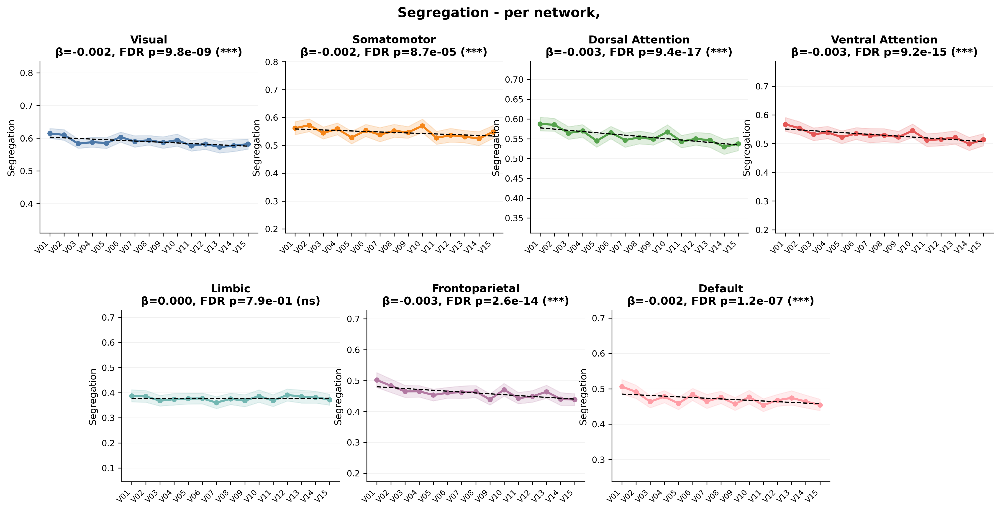

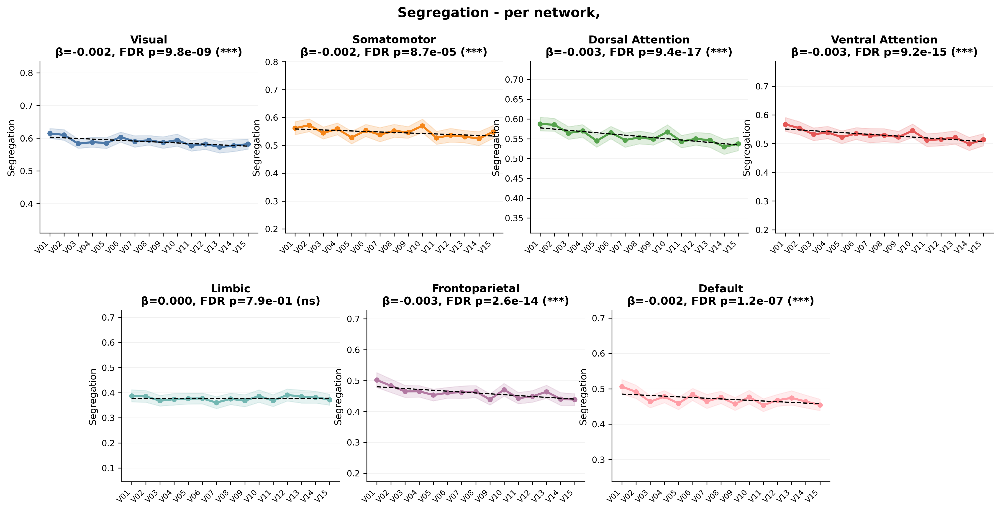

In [13]:
plot_longitudinal_trends_per_network(
    df_long=df_r200,
    stats_df=seg_stats,
    yeo_names=YEO_NAMES,
    metric='segregation',
    save_path=os.path.join(FIGURES_DIR, 'segregation_session_means_trends.png'),
)

C:\Users\tesni\AppData\Local\Temp\ipykernel_14084\3346849773.py:26: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  work.groupby(['subject', 'network', 'session_num', 'session'], as_index=False)[metric]
C:\Users\tesni\AppData\Local\Temp\ipykernel_14084\3346849773.py:67: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for _, g in net_subj.groupby('subject'):
C:\Users\tesni\AppData\Local\Temp\ipykernel_14084\3346849773.py:67: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt t

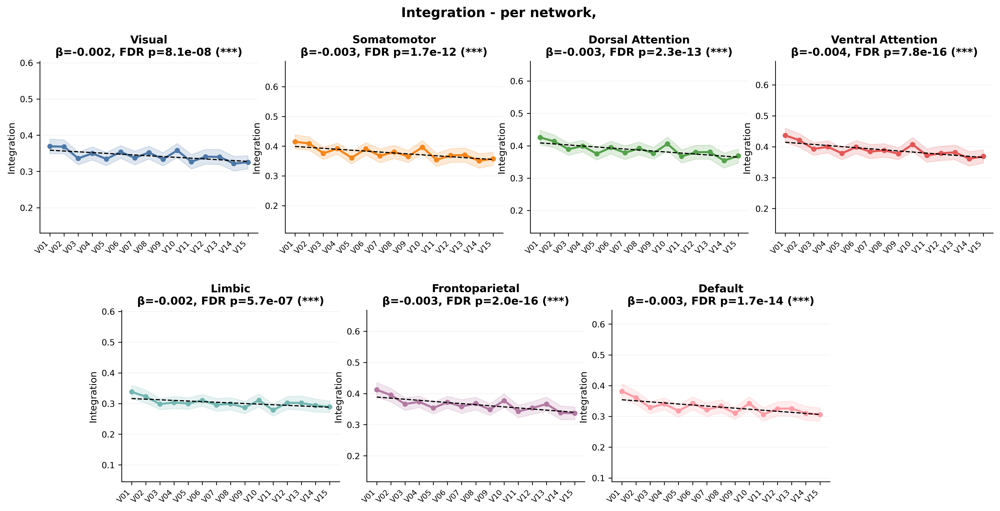

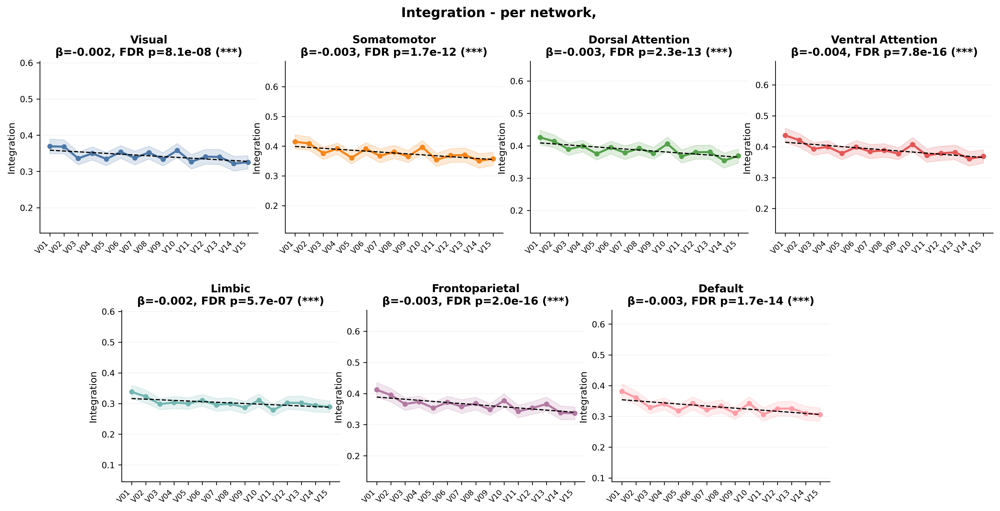

In [14]:
plot_longitudinal_trends_per_network(
    df_long=df_r200,
    stats_df=int_stats,
    yeo_names=YEO_NAMES,
    metric='integration',
    save_path=os.path.join(FIGURES_DIR, 'integration_session_means_trends.png'),
)

In [22]:
df_r200

,subject,session,run,condition,network,segregation,integration,session_num
0,003GNV,V01,Run1,Feedback,1,0.689422,0.472992,1
1,003GNV,V01,Run1,Feedback,2,0.648899,0.548251,1
2,003GNV,V01,Run1,Feedback,3,0.667988,0.495816,1
3,003GNV,V01,Run1,Feedback,4,0.616424,0.528531,1
4,003GNV,V01,Run1,Feedback,5,0.533973,0.502783,1
...,...,...,...,...,...,...,...,...
13197,056GNV,V15,Run6,NoFeedback,3,0.683259,0.341189,15
13198,056GNV,V15,Run6,NoFeedback,4,0.540546,0.374014,15
13199,056GNV,V15,Run6,NoFeedback,5,0.540113,0.339847,15
13200,056GNV,V15,Run6,NoFeedback,6,0.489842,0.373858,15


In [32]:
import os
FIGURES_DIR = "../../../Results/Tessnim/figures/"
os.makedirs(FIGURES_DIR, exist_ok=True)
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.formula.api as smf


def plot_trend_per_network(
    df_long,
    stats_df,
    yeo_names,
    metric='segregation',
    condition_filter=None,
    figsize=(20, 8),
    dpi=300,
    save_path=None,
):
    metric_labels = {
        'segregation': 'Segregation',
        'integration': 'Integration',
        'normalized_segregation': 'Norm. Segregation (seg-int)/seg',
    }

    # ── filter condition if requested ────────────────────────────────────
    work_df = df_long.copy()
    if condition_filter is not None:
        work_df = work_df[work_df['condition'] == condition_filter].copy()
    cond_str = f" [{condition_filter}]" if condition_filter else ""

    # ── session ordering ─────────────────────────────────────────────────
    all_sessions = (
        work_df['session']
        .dropna()
        .unique()
    )
    all_sessions = sorted(all_sessions, key=lambda s: int(str(s).replace('V', '')))
    sess_to_x = {s: i for i, s in enumerate(all_sessions)}

    # ── figure ───────────────────────────────────────────────────────────
    fig, axes_list = make_centered_7_axes(figsize=figsize, dpi=dpi)
    fig.suptitle(
        f"{metric_labels[metric]} per network {cond_str}",
        fontsize=14, fontweight='bold', y=0.98
    )

    for net_i, ax in enumerate(axes_list):
        net_id = net_i + 1
        net_df = work_df[work_df['network'] == net_id].copy()

        if net_df.empty:
            ax.set_title(yeo_names[net_i])
            ax.axis('off')
            continue

        # ── observed SEM per session (across all runs) ───────────────────
        sess_stats = (
            net_df.groupby('session')[metric]
            .agg(mean='mean', sem=lambda x: x.sem())
            .reindex(all_sessions)   # keep session order
            .reset_index()
        )
        sess_stats['x'] = sess_stats['session'].map(sess_to_x)

        # ── mixed model fitted on ALL runs ───────────────────────────────
        # random intercept per subject; session_num is the continuous predictor
        lme = smf.mixedlm(
            f"{metric} ~ session_num",
            data=net_df,
            groups=net_df["subject"]
        ).fit(reml=True)

        # predicted fixed-effect trend over the session range
        x_num = np.linspace(
            net_df['session_num'].min(),
            net_df['session_num'].max(),
            200
        )
        y_pred = lme.params['Intercept'] + lme.params['session_num'] * x_num

        # map x_num back to axis positions (same scale as sess_to_x)
        x_num_min = net_df['session_num'].min()
        x_num_max = net_df['session_num'].max()
        x_axis = (x_num - x_num_min) / (x_num_max - x_num_min) * (len(all_sessions) - 1)

        # ── plot observed means + SEM bars ───────────────────────────────
        ax.errorbar(
            sess_stats['x'],
            sess_stats['mean'],
            yerr=sess_stats['sem'],
            fmt='o',
            color=NETWORK_COLORS[net_i],
            markersize=4,
            linewidth=0.8,
            elinewidth=0.8,
            capsize=2,
            label='Session mean ± SEM',
            zorder=2,
        )

        # ── plot mixed model trend line ──────────────────────────────────
        ax.plot(
            x_axis, y_pred,
            color='black',
            linestyle='--',
            linewidth=1.4,
            label='LME trend',
            zorder=3,
        )

        # ── axes formatting ──────────────────────────────────────────────
        ax.set_xticks(range(len(all_sessions)))
        ax.set_xticklabels(all_sessions, rotation=45, ha='right', fontsize=7)
        ax.set_ylabel(metric_labels[metric], fontsize=8)
        ax.set_title(yeo_names[net_i], fontsize=10, pad=10)
        ax.spines[['top', 'right']].set_visible(False)

        # if metric == 'normalized_segregation':
        #     ax.axhline(0, color='gray', linewidth=0.6, linestyle=':')

        if net_i == 0:
            ax.legend(fontsize=7, frameon=False)


        # ── stats annotation ────────────────────────────────────────────
        stat_row = stats_df.loc[stats_df['network'] == net_id]
        if not stat_row.empty:
            beta   = float(stat_row['beta_session'].iloc[0])
            p_corr = float(stat_row['p_corr'].iloc[0])
            stars  = stars_from_p(p_corr)
            p_fmt  = f"{p_corr:.4f}" if p_corr >= 0.0001 else f"{p_corr:.2e}"
            ax.text(
                0.98, 0.96,
                f"β={beta:.3f}\n({stars})",
                transform=ax.transAxes,
                ha='right', va='top', fontsize=8,
                bbox=dict(
                    boxstyle='round,pad=0.25',
                    fc='white', ec='none', alpha=0.8
                ),
            )

    if save_path is not None:
        fig.savefig(save_path, dpi=dpi, bbox_inches='tight')

    plt.show()
    return fig

c:\Users\tesni\miniconda3\envs\ada\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)
c:\Users\tesni\miniconda3\envs\ada\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)
c:\Users\tesni\miniconda3\envs\ada\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)
c:\Users\tesni\miniconda3\envs\ada\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


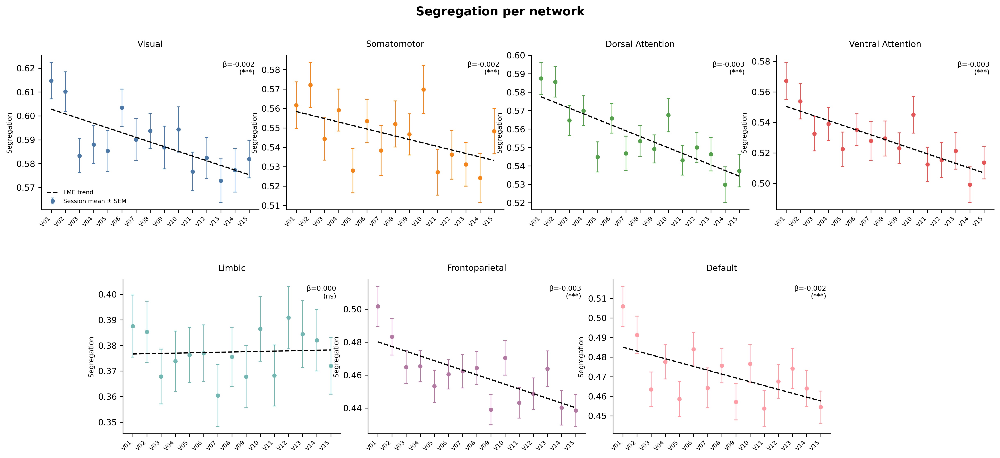

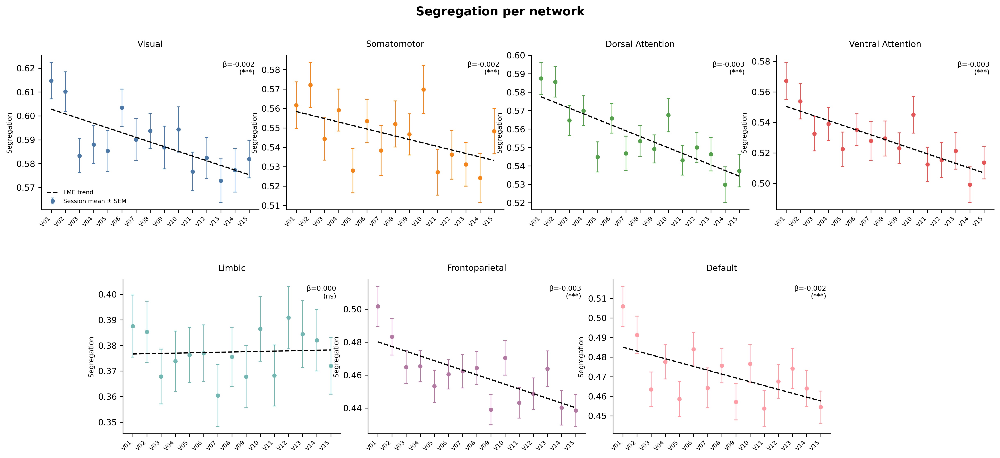

In [28]:
plot_trend_per_network(
    df_long=df_r200,
    stats_df=seg_stats,
    yeo_names=YEO_NAMES,
    metric='segregation',
    condition_filter=None,
    save_path=os.path.join(FIGURES_DIR, 'segregation_trend_per_network.png'),
)

c:\Users\tesni\miniconda3\envs\ada\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)
c:\Users\tesni\miniconda3\envs\ada\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)
c:\Users\tesni\miniconda3\envs\ada\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)
c:\Users\tesni\miniconda3\envs\ada\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)
c:\Users\tesni\miniconda3\envs\ada\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2237: ConvergenceWarni

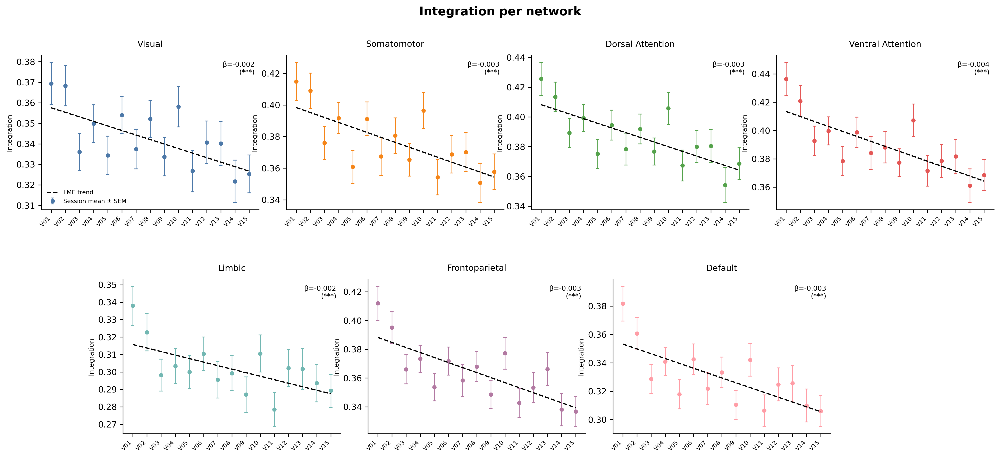

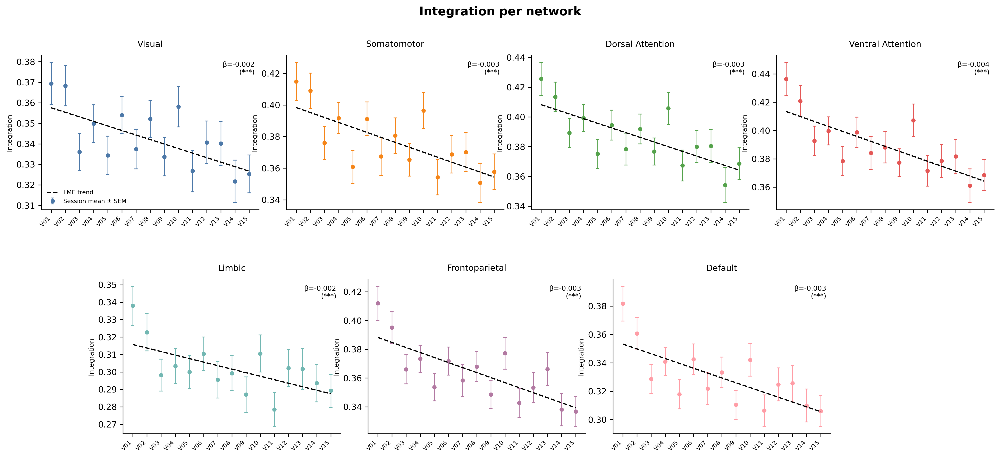

In [17]:
plot_trend_per_network(
    df_long=df_r200,
    stats_df=int_stats,
    yeo_names=YEO_NAMES,
    metric='integration',
    condition_filter=None,
    save_path=os.path.join(FIGURES_DIR, 'integration_trend_per_network.png'),
)

c:\Users\tesni\miniconda3\envs\ada\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:1634: UserWarning: Random effects covariance is singular
  warnings.warn(msg)
c:\Users\tesni\miniconda3\envs\ada\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2054: UserWarning: The random effects covariance matrix is singular.
  warnings.warn(_warn_cov_sing)
c:\Users\tesni\miniconda3\envs\ada\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)
c:\Users\tesni\miniconda3\envs\ada\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2245: UserWarning: The random effects covariance matrix is singular.
  warnings.warn(_warn_cov_sing)
c:\Users\tesni\miniconda3\envs\ada\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2261: ConvergenceWarning: The Hessian matrix at the estimated parameter values is not positive definite.
  w

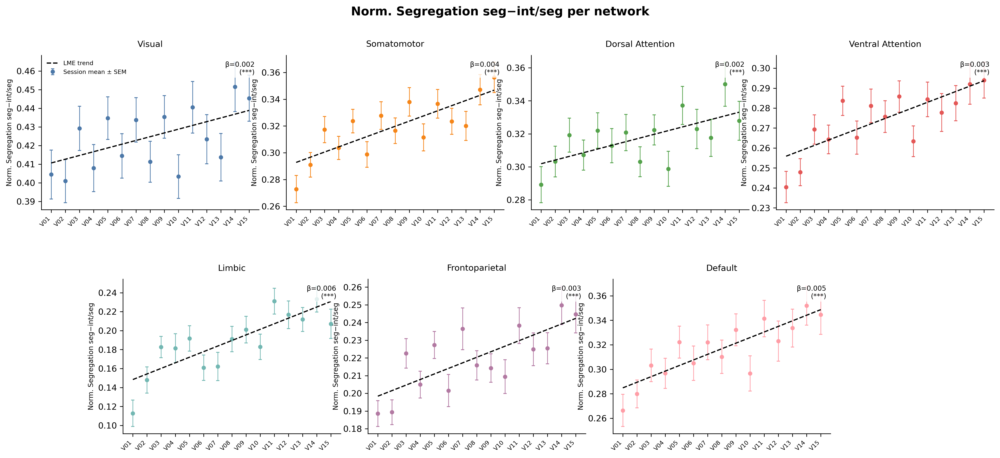

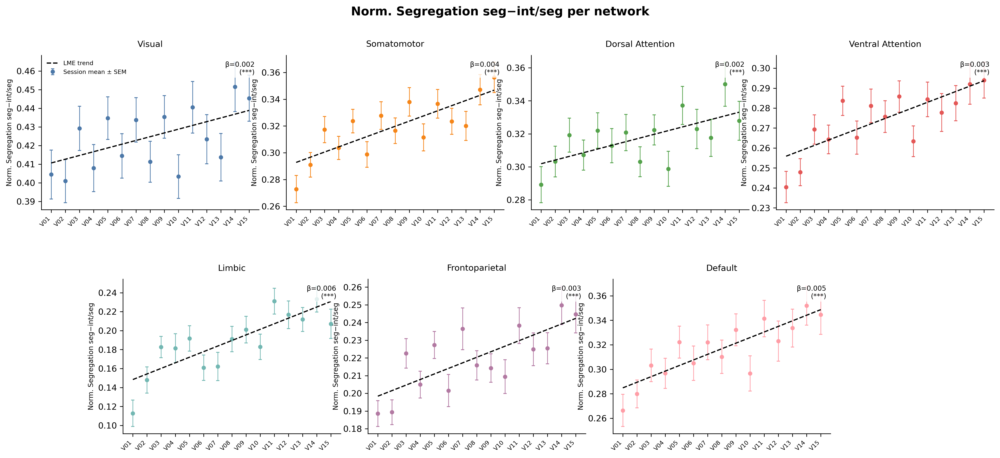

In [31]:
df_r200["normalized_segregation"] = (df_r200["segregation"] - df_r200["integration"]) / (df_r200["segregation"])

norm_seg_stats = fit_lmm_per_network(df_r200, metric='normalized_segregation')

plot_trend_per_network(
    df_long=df_r200,
    stats_df=norm_seg_stats,
    yeo_names=YEO_NAMES,
    metric='normalized_segregation',
    condition_filter=None,
    save_path=os.path.join(FIGURES_DIR, 'normalized_segregation_trend_per_network.png'),
)

In [18]:
# just look, don't touch
df_r200[['session', 'session_num']].drop_duplicates().sort_values('session_num')

,session,session_num
0,V01,1
49,V02,2
91,V03,3
133,V04,4
175,V05,5
217,V06,6
259,V07,7
301,V08,8
343,V09,9
385,V10,10
